In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sb

%matplotlib inline

import plotly as py
import cufflinks as cf
from plotly.offline import iplot
import plotly.graph_objs as go
from textblob import TextBlob
py.offline.init_notebook_mode(connected=True)
cf.go_offline()

In [2]:
import zipfile
df = pd.read_csv('amazon_baby.csv.zip', compression='zip')
df

,name,review,rating
0,Planetwise Flannel Wipes,"These flannel wipes are OK, but in my opinion ...",3
1,Planetwise Wipe Pouch,it came early and was not disappointed. i love...,5
2,Annas Dream Full Quilt with 2 Shams,Very soft and comfortable and warmer than it l...,5
3,Stop Pacifier Sucking without tears with Thumb...,This is a product well worth the purchase. I ...,5
4,Stop Pacifier Sucking without tears with Thumb...,All of my kids have cried non-stop when I trie...,5
...,...,...,...
183526,Baby Teething Necklace for Mom Pretty Donut Sh...,Such a great idea! very handy to have and look...,5
183527,Baby Teething Necklace for Mom Pretty Donut Sh...,This product rocks! It is a great blend of fu...,5
183528,Abstract 2 PK Baby / Toddler Training Cup (Pink),This item looks great and cool for my kids.......,5
183529,"Baby Food Freezer Tray - Bacteria Resistant, B...",I am extremely happy with this product. I have...,5


### Q.12 Check the number of the reviews received for each product.


In [3]:
df.name.value_counts()

Vulli Sophie the Giraffe Teether                                            785
Simple Wishes Hands-Free Breastpump Bra, Pink, XS-L                         562
Infant Optics DXR-5 2.4 GHz Digital Video Baby Monitor with Night Vision    561
Baby Einstein Take Along Tunes                                              547
Cloud b Twilight Constellation Night Light, Turtle                          520
                                                                           ... 
Foundations Hideaway Compact Sized Folding Crib, Antique Cherry               1
Fancy Baby Bib with Pink Bows                                                 1
HandySitt Child Chair Beech w/Stainless Steel                                 1
Disney Mickey and Minnie 3 Pack Bottles (BLUE)                                1
Britax Marathon Carseat - All Star Blue                                       1
Name: name, Length: 32417, dtype: int64

### Q.13 Check the products that have more than 15 reviews.

In [4]:
total= df.name.value_counts()
total[total>15]

Vulli Sophie the Giraffe Teether                                                        785
Simple Wishes Hands-Free Breastpump Bra, Pink, XS-L                                     562
Infant Optics DXR-5 2.4 GHz Digital Video Baby Monitor with Night Vision                561
Baby Einstein Take Along Tunes                                                          547
Cloud b Twilight Constellation Night Light, Turtle                                      520
                                                                                       ... 
Bumkins Dr. Seuss Footed Sleeper, Red Stripe, 6 Months                                   16
Carters Keep Me Close Blanket, Ecru                                                      16
Boppy 100% Organic Cotton Slipcover                                                      16
Kanga Care Pail Liner, Crimson                                                           16
Born Free 5 oz. BPA-Free Decorated Bottle with ActiveFlow Venting Technology, 3-

### Q.14 Find any missing review are present or not, If present remove those data.

In [5]:
df.isnull().sum()

name      318
review    829
rating      0
dtype: int64

In [6]:
df.dropna(subset=["name", "review"], inplace=True)
df.isnull().sum()

name      0
review    0
rating    0
dtype: int64

### Q.15 . Clean the data and remove the special characters and replace the contractions with its expansion by converting the uppercase character to lower case. Also, remove the punctuations.

In [7]:
#list of contractions
contractions = {
"a'ight":"alright",
"ain't":"are not",
"amn't":"am not",
"aren't":"are not",
"can't":"cannot",
"'cause": "because",
"could've":"could have",
"couldn't":"could not",
"couldn't've":"could not have",
"daren't":"dare not",
"daresn't":"dare not",
"dasn't":"dare not",
"didn't":"did not",
"doesn't":"does not",
"don't":"do not",
"everybody's":"everybody is",
"everyone's":"everyone is",
"giv'n":"given",
"gonna":"going to",
"gon't":"go not", 
"gotta":"got to",
"hadn't":"had not",
"had've":"had have",
"hasn't":"has not",
"haven't":"have not",
"he'd":"he had", 
"he'll":"he will",
"he's":"he is",
"here's":"here is",
"how'd":"how did",
"how'll":"how will",
"how're":"how are",
"how's":"how is",
"I'd":"I had",
"I'd've":"I would have",
"I'd'nt":"I would not",
"I'd'nt've":"I would not have",
"I'll":"I will",
"I'm":"I am",
"I've":"I have",
"isn't":"is not",
"it'd":"it would",
"it'll":"it will",
"it's":"it is",
"let's":"let us",
"ma'am":"madam",
"mayn't":"may not",
"may've":"may have",
"mightn't":"might not",
"might've":"might have",
"mustn't":"must not",
"mustn't've":"must not have",
"must've":"must have",
"needn't":"need not",
"needn't've":"need not have",
"o'clock":"of the clock",
"oughtn't":"ought not",
"oughtn't've":"ought not have",
"shan't":"shall not",
"she'd":"she would",
"she'll":"she will",
"she's":"she is",
"should've":"should have",
"shouldn't":"should not",
"shouldn't've":"should not have",
"somebody's":"somebody is",
"someone's":"someone is",
"something's":"something is",
"so're":"so are",
"so’s":"so is",
"so’ve":"so have",
"that'll":"that will",
"that're":"that are",
"that's":"that is",
"that'd":"that would",
"there'd":"there would",
"there'll":"there will",
"there're":"there are",
"there's":"there is",
"these're":"these are",
"these've":"these have",
"they'd":"they would",
"they'll":"they will",
"they're":"they are",
"they've":"they have",
"this's":"this is",
"those're":"those are",
"those've":"those have",
"to've":"to have",
"wasn't":"was not",
"we'd":"we would",
"we'd've":"we would have",
"we'll":"we will",
"we're":"we are",
"we've":"we have",
"weren't":"were not",
"what'd":"what did",
"what'll":"what will",
"what're":"what are",
"what's":"what is",
"what've":"what have",
"when's":"when is",
"where'd":"where did",
"where'll":"where will",
"where're":"where are",
"where's":"where is",
"where've":"where have",
"which'd":"which would",
"which'll":"which will",
"which're":"which are",
"which's":"which is",
"which've":"which have",
"who'd":"who would",
"who'd've":"who would have",
"who'll":"who will",
"who're":"who are",
"who's":"who is",
"who've":"who have",
"why'd":"why did",
"why're":"why are",
"why's":"why is",
"won't":"will not",
"would've":"would have",
"wouldn't":"would not",
"wouldn't've":"would not have",
"y'at":"you at",
"yes’m":"yes madam",
"you'd":"you would",
"you'll":"you will",
"you're":"you are",
"you've":"you have"}

def contractions_expansion(x):
    if type(x) is str:
        x = x.replace('\\','')
        x = x.replace('!','')
        x = x.replace('?','')
        x = x.replace('#','')
        x = x.replace('$','')
        x = x.replace('%','')
        x = x.replace('&','')
        x = x.replace('(','')
        x = x.replace(')','')
        x = x.replace(',','')
        x = x.replace('+','')
        x = x.replace('-','')
        x = x.replace('*','')
        x=x.lower()
        for key in contractions:
            value = contractions[key]
            x = x.replace(key, value)
        return x
    else:
        return x

In [8]:
df["review"] = df["review"].apply(lambda x:contractions_expansion(x))
df.head()

,name,review,rating
0,Planetwise Flannel Wipes,these flannel wipes are ok but in my opinion n...,3
1,Planetwise Wipe Pouch,it came early and was not disappointed. i love...,5
2,Annas Dream Full Quilt with 2 Shams,very soft and comfortable and warmer than it l...,5
3,Stop Pacifier Sucking without tears with Thumb...,this is a product well worth the purchase. i ...,5
4,Stop Pacifier Sucking without tears with Thumb...,all of my kids have cried nonstop when i tried...,5


### Q.16 Add the Polarity, length of the review, the word count and average word length of each review.


In [9]:
df['polarity'] = df['review'].apply(lambda x: TextBlob(x).sentiment.polarity)
df['review_len'] = df['review'].apply(lambda x:len(x))
df['word_count'] = df['review'].apply(lambda x: len(x.split()))
def get_avg_word_len(x):
    words = x.split()
    word_len = 0
    for word in words:
        word_len = word_len + len(word)
        
    return word_len/len(words) 
df["avg_word_len"] = df['review'].apply(lambda x: get_avg_word_len(x))
df.head()

,name,review,rating,polarity,review_len,word_count,avg_word_len
0,Planetwise Flannel Wipes,these flannel wipes are ok but in my opinion n...,3,0.083333,446,79,4.632911
1,Planetwise Wipe Pouch,it came early and was not disappointed. i love...,5,0.367000,158,30,4.300000
2,Annas Dream Full Quilt with 2 Shams,very soft and comfortable and warmer than it l...,5,0.293333,143,23,5.260870
3,Stop Pacifier Sucking without tears with Thumb...,this is a product well worth the purchase. i ...,5,0.318767,385,74,4.162162
4,Stop Pacifier Sucking without tears with Thumb...,all of my kids have cried nonstop when i tried...,5,0.558333,396,76,4.184211


### Q.17 Visualize the distribution of the word count, review length, and polarity

In [10]:
df['word_count'].iplot(kind='hist', 
                       bins=100, 
                       xTitle='Word Count',
                       linecolor='black',
                       yTitle='Count',
                       title='Word Count Distribution of Review')

In [11]:
df['review_len'].iplot(
    kind='hist',
    bins=100,
    xTitle='review length',
    linecolor='black',
    yTitle='count',
    title='Length Distribution of Review')

In [12]:
df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    yTitle='count',
    title='Sentiment Polarity Distribution')

### Q.18 Visualize polarity considering the rating.


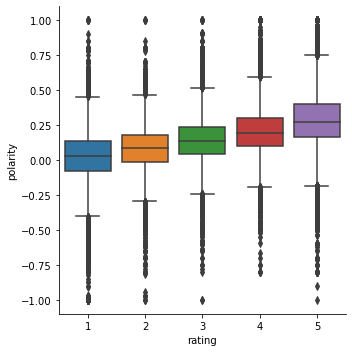

In [13]:
sb.catplot(x='rating', y='polarity', data=df, kind='box')

### Q.19 Visualize the count of the reviews of each rating available in the dataset.

In [21]:
df.groupby('rating').count().iplot(kind='bar', columns='review', yTitle='Count', linecolor='black', opacity=0.8, title='Distribution of Review Count of each Rating', xTitle='Rating')

### Q.20 .List the Top 20 products based on the polarity.


In [22]:
df.sort_values(by = 'polarity', ascending = False).head(20)

,name,review,rating,polarity,review_len,word_count,avg_word_len
175167,Stella Mamma organic silicone necklace-phenix ...,maya daughter loves it and so do i : it matc...,5,1.0,106,20,4.250000
145738,"Philips AVENT Day Disposable Breast Pads, 60-C...",these pads are the best....super absorbent and...,5,1.0,114,20,4.750000
83874,"4Moms Mamaroo Infant Seat, Orange",the best chair... swing....rocker... all in on...,4,1.0,94,18,4.277778
33724,Lamaze Play &amp; Grow Freddie the Firefly Tak...,wonderful toy ... babes lovetoddlers too,5,1.0,40,6,5.833333
18632,Graco SnugRider Infant Car Seat Stroller Frame,i can say i was very happy with this produck a...,5,1.0,116,24,3.875000
77379,Spongebob Squarepants Toddler Bedding Set - 4p...,my grandson and his mommy are very happy with ...,5,1.0,100,21,3.809524
127164,C.R. Gibson Slim Bound Journal Album for Photo...,she will always know she had the owl collectio...,5,1.0,118,21,4.666667
109961,"Angel Dear Chenille Blanket, White",i bought this for my friends daughter. she is ...,5,1.0,196,36,4.472222
61082,"BooginHead Pacifier Holder, Pink Polka Dot",i still have this for my kids and its the best...,5,1.0,87,20,3.400000
102027,"Mud Pie Baby Girl Silver Plate Rattle, Pink Ca...",i got this item to use as a decortaion for my ...,5,1.0,115,26,3.461538


### Q.21 Visualize to check whether the review length changes with rating.

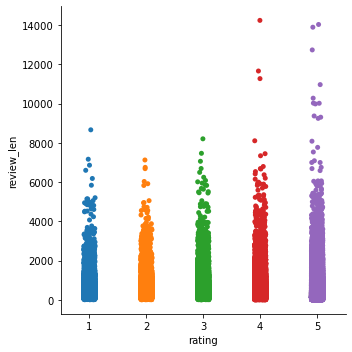

In [23]:
sb.catplot(x='rating', y='review_len', data=df)

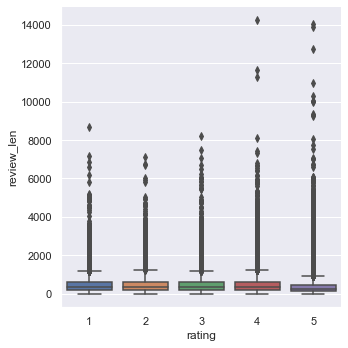

In [30]:
sb.catplot(x='rating', y='review_len', data=df, kind='box')

### Q.22 Visualize the distribution of Top 25 Unigram, Bigram and Trigram.

In [33]:
from sklearn.feature_extraction.text import CountVectorizer

#unigram
def get_top_n_words(x, n=None):
    vec = CountVectorizer(stop_words='english').fit(x)
    bag_of_words = vec.transform(x)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_words(df['review'], 25)
df1 = pd.DataFrame(common_words, columns = ['Unigram Text', 'Count'])
df1

,Unigram Text,Count
0,baby,78782
1,great,58913
2,just,56298
3,use,52662
4,like,51111
5,love,43644
6,seat,43376
7,little,41487
8,easy,40667
9,old,37457


In [34]:
df1.groupby('Unigram Text').sum()['Count'].sort_values(ascending=False).iplot(kind='bar', yTitle='Count', linecolor='black', title='Top 25 words in review before removing stop words')

In [35]:
#bigram
def get_top_n_bigram(x, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(x)
    bag_of_words = vec.transform(x)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_bigram(df['review'], 25)
df2 = pd.DataFrame(common_words, columns = ['Bigram Text', 'Count'])
df2

,Bigram Text,Count
0,car seat,12296
1,month old,10853
2,year old,8944
3,months old,6797
4,highly recommend,5981
5,diaper bag,5000
6,easy clean,4881
7,easy use,4690
8,works great,3836
9,great product,3750


In [36]:
df2.groupby('Bigram Text').sum()['Count'].sort_values(ascending=False).iplot(kind='bar', yTitle='Count', linecolor='black', title='The distribution of Top 25 Bigram')

In [37]:
#trigram
def get_top_n_trigram(x, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), stop_words="english").fit(x)
    bag_of_words = vec.transform(x)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_trigram(df['review'], 25)
df3 = pd.DataFrame(common_words, columns = ['Trigram Text', 'Count'])
df3

,Trigram Text,Count
0,month old son,1252
1,month old daughter,1009
2,son months old,879
3,baby shower gift,813
4,month old loves,801
5,highly recommend product,767
6,year old son,703
7,love love love,695
8,daughter months old,681
9,year old daughter,656


In [38]:
df3.groupby('Trigram Text').sum()['Count'].sort_values(ascending=False).iplot(kind='bar', yTitle='Count', linecolor='black', title='The distribution of Top 25 Trigram')